# DeepMusic - Music generation with RNNs

In [1]:
%%capture
!sudo apt install -y fluidsynth
!pip install --upgrade pyfluidsynth
!pip install pretty_midi
!pip install miditok
!pip install split-folders
!pip install tqdm
!pip install -q -U keras-tuner

## Imports

In [2]:
import sys
import pathlib
import glob
import os
import shutil
import math
import collections
import pretty_midi
import fluidsynth
import json
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
import keras_tuner as kt
import datetime

from pathlib import Path
from IPython import display
from google.colab import drive
from miditok import TSD
from tqdm.notebook import tqdm

## Loading the datasets

In [3]:
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [4]:
!cp -r /content/drive/MyDrive/__Baldi_Cecchetti/datasets /content
!unzip -qq /content/datasets/dataset_jazz.zip -d /content/datasets
!unzip -qq /content/datasets/dataset_piano.zip -d /content/datasets

In [5]:
dataset_jazz = Path('datasets/content/dataset_jazz')
dataset_piano = Path('datasets/content/dataset_piano')

## Loading the models

In [6]:
!cp -r /content/drive/MyDrive/__Baldi_Cecchetti/models/RNN/saved_model /content
!mkdir generated_music

## Utilities

Utility function use to reproduce MIDI files inside a Colab notebook.

In [7]:
_SAMPLING_RATE = 32000

def display_audio(midi_path: str, seconds=30):
    pm = pretty_midi.PrettyMIDI(midi_path)
    waveform = pm.fluidsynth(fs=_SAMPLING_RATE)
    # Take a sample of the generated waveform to mitigate kernel resets
    waveform_short = waveform[:seconds*_SAMPLING_RATE]
    return display.Audio(waveform_short, rate=_SAMPLING_RATE)

# Monophonic music generation

## Jazz Dataset

### TSD Tokenizer

We use the TSD tokenizer defined in the Tokenization notebook.

In [8]:
tokenizer_jazz = TSD(params=Path(dataset_jazz/'train/tokens/config.txt'))
tokenizer_jazz.vocab

Vocabulary - 251 tokens of 5 types

In [9]:
train_dir = pathlib.Path(dataset_jazz/'train/tokens')
test_dir = pathlib.Path(dataset_jazz/'test/tokens')
val_dir = pathlib.Path(dataset_jazz/'val/tokens')

train_files = glob.glob(str(train_dir/'*.json'))
test_files = glob.glob(str(test_dir/'*.json'))
val_files = glob.glob(str(val_dir/'*.json'))

print('Training files: {}, Test files: {}, Validation files: {}'.format(len(train_files), len(test_files), len(val_files)))

Training files: 300, Test files: 86, Validation files: 42


### Preparing the training data

Utility function that splits a sequence into input and target

In [11]:
def split_input_target(sequence):
    input = sequence[:-1]
    target = sequence[1:]
    return input, target

Utility function that creates training sequences from a list of files

In [12]:
def create_sequences(files, seq_length):

  sequences_array = []

  for token_file in tqdm(files):
    f = open(token_file)
    json_file = json.load(f)
    tokens = json_file['tokens'][0]
    dataset = tf.data.Dataset.from_tensor_slices(tokens)
    sequences = dataset.batch(seq_length+1, drop_remainder=True)
    sequences_array.append(sequences)

  sequences_concatenated = sequences_array[0]

  for sequences in sequences_array[1:]:
    sequences_concatenated = sequences_concatenated.concatenate(sequences)
    
  dataset = sequences_concatenated.map(split_input_target)
  return dataset

In [13]:
SEQ_LENGTH = 64

We create the sequences for the training data.

In [ ]:
train_ds = create_sequences(train_files, SEQ_LENGTH)

for input_example, target_example in train_ds.take(1):
    print("Input:", input_example)
    print("Target:", target_example)

  0%|          | 0/300 [00:00<?, ?it/s]

Input: tf.Tensor(
[247  44 109 125 190  48 112 125 190  49 109 124 189  51 114 129 194  49
 113 123 188  48 110 126 190  49 111 125 190  53 113 128 194  44 109 125
 190  46 111 126 192  48 110 125 189  49 112 127 192  46 111 126 193  42
 109 124 189  39 107 125 189  48 114 126], shape=(64,), dtype=int32)
Target: tf.Tensor(
[ 44 109 125 190  48 112 125 190  49 109 124 189  51 114 129 194  49 113
 123 188  48 110 126 190  49 111 125 190  53 113 128 194  44 109 125 190
  46 111 126 192  48 110 125 189  49 112 127 192  46 111 126 193  42 109
 124 189  39 107 125 189  48 114 126 192], shape=(64,), dtype=int32)


In [ ]:
print("Number of training sequences: ", len(train_ds))

Number of training sequences:  7688


We create the sequences for the test and validation data.

In [14]:
test_ds = create_sequences(test_files, SEQ_LENGTH)
val_ds = create_sequences(val_files, SEQ_LENGTH)

  0%|          | 0/86 [00:00<?, ?it/s]

  0%|          | 0/42 [00:00<?, ?it/s]

Utility function that prepares a dataset so that it can be fed to the Neural Network.

* `shuffle` randomly shuffles the sequences. This is a best practice to prevent the model from learning sequences based on their ordering
* `batch` combines consecutive elements of the dataset into batches. Each batch corresponds to a training step of the neural network
* `cache` caches the elements of the dataset in memory
* `prefetch` allows later elements to be prepared while the current element is being processed. This often improves latency and throughput

In [20]:
def prepare_dataset(dataset):

  # Batch size
  BATCH_SIZE = 64

  # Buffer size to shuffle the dataset
  # (TF data is designed to work with possibly infinite sequences,
  # so it doesn't attempt to shuffle the entire sequence in memory. Instead,
  # it maintains a buffer in which it shuffles elements).
  BUFFER_SIZE = 10000
  
  dataset = (
    dataset
    .shuffle(BUFFER_SIZE)
    .batch(BATCH_SIZE, drop_remainder=True)
    .prefetch(tf.data.experimental.AUTOTUNE))
  
  return dataset

In [ ]:
train_ds = prepare_dataset(train_ds)
train_ds

<PrefetchDataset element_spec=(TensorSpec(shape=(64, 64), dtype=tf.int32, name=None), TensorSpec(shape=(64, 64), dtype=tf.int32, name=None))>

In [ ]:
print('Number of training batches: {}'.format(len(train_ds)))

Number of training batches: 120


In [ ]:
val_ds = prepare_dataset(val_ds)
val_ds

<PrefetchDataset element_spec=(TensorSpec(shape=(64, 64), dtype=tf.int32, name=None), TensorSpec(shape=(64, 64), dtype=tf.int32, name=None))>

In [ ]:
print('Number of validation batches: {}'.format(len(val_ds)))

Number of validation batches: 21


### Building the model

In [ ]:
callbacks = [
    tf.keras.callbacks.ModelCheckpoint(
        filepath='./model/model_{epoch}',
        save_weights_only=True,
        save_best_only=True),
]

`build_model` builds a Keras model according to the values of its parameters. In general our model is composed of three layers:

* `Embedding`, a trainable lookup table that will map each token to a vector with `embedding_dim` dimensions;
* `LSTM`, a LSTM with size `lstm_units`
* `Dense`, the output layer, with `vocab_size` outputs. It outputs one logit for each token in the vocabulary. Each logit is the log-likelihood of each token according to the model.

We use `SparseCategoricalCrossentropy` as loss function, which computes the cross entropy loss between the labels and predictions using the logits.

We use the `Adam` optimizer. Adam optimization is a stochastic gradient descent method that is based on adaptive estimation of first-order and second-order moments.

In [ ]:
def build_model(vocab_size, embedding_dim, lstm_units, lstm_layers, learning_rate):
  inputs = tf.keras.layers.Input(shape=(None,), dtype=tf.int32)
  embedding_layer = tf.keras.layers.Embedding(
      input_dim=vocab_size,
      output_dim=embedding_dim
      )
  x = embedding_layer(inputs)

  for _ in range(lstm_layers):
    x = tf.keras.layers.LSTM(
        lstm_units, return_sequences=True
        )(x)

  outputs = tf.keras.layers.Dense(vocab_size)(x)

  model = tf.keras.Model(inputs=inputs, outputs=outputs)
  loss_fn = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)
  model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate), loss=loss_fn)
  return model

Let us define a simple model.

In [ ]:
VOCAB_SIZE = len(tokenizer_jazz.vocab)

# The embedding dimension
EMBEDDING_DIM = 64

SEQ_LENGTH = 64

# Number of RNN units
LSTM_UNITS = 64

LSTM_LAYERS = 1

LEARNING_RATE = 1e-3

In [ ]:
model_jazz = build_model(VOCAB_SIZE, EMBEDDING_DIM, LSTM_UNITS, LSTM_LAYERS, LEARNING_RATE)
model_jazz.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, None)]            0         
                                                                 
 embedding (Embedding)       (None, None, 64)          16064     
                                                                 
 lstm (LSTM)                 (None, None, 64)          33024     
                                                                 
 dense (Dense)               (None, None, 251)         16315     
                                                                 
Total params: 65,403
Trainable params: 65,403
Non-trainable params: 0
_________________________________________________________________


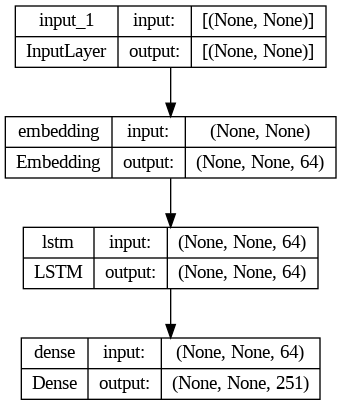

In [ ]:
tf.keras.utils.plot_model(model_jazz, show_shapes=True)

### Training the model

We train the model for 100 epochs.

In [ ]:
history_jazz = model_jazz.fit(train_ds, validation_data=val_ds, epochs=100, callbacks=callbacks, use_multiprocessing=True)

Epoch 1/100
120/120 [==============================] - 14s 51ms/step - loss: 4.4851 - val_loss: 4.2313
Epoch 2/100
120/120 [==============================] - 3s 13ms/step - loss: 4.1646 - val_loss: 4.0071
Epoch 3/100
120/120 [==============================] - 2s 12ms/step - loss: 3.3600 - val_loss: 2.9328
Epoch 4/100
120/120 [==============================] - 2s 7ms/step - loss: 2.7735 - val_loss: 2.6928
Epoch 5/100
120/120 [==============================] - 2s 9ms/step - loss: 2.6326 - val_loss: 2.6128
Epoch 6/100
120/120 [==============================] - 2s 7ms/step - loss: 2.5800 - val_loss: 2.5774
Epoch 7/100
120/120 [==============================] - 2s 7ms/step - loss: 2.5519 - val_loss: 2.5513
Epoch 8/100
120/120 [==============================] - 2s 7ms/step - loss: 2.5335 - val_loss: 2.5407
Epoch 9/100
120/120 [==============================] - 2s 7ms/step - loss: 2.5211 - val_loss: 2.5304
Epoch 10/100
120/120 [==============================] - 2s 10ms/step - loss: 2.5121 - v

The `plot_loss` function plots the validation loss against the training loss.

In [ ]:
# plot the loss
def plot_loss(history):
  loss = history.history["loss"]
  val_loss = history.history["val_loss"]
  plt.figure()
  plt.plot(val_loss,'o-b', label='validation loss')
  plt.title('val_loss')
  plt.plot(loss,'o-r', label='train loss')
  plt.title('loss')
  plt.legend()
  plt.show()

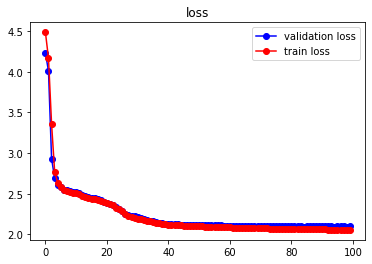

In [ ]:
plot_loss(history_jazz)

### Managing underfitting

The previous model underfits. Let us define a more complex model.

In [ ]:
VOCAB_SIZE = len(tokenizer_jazz.vocab)

# The embedding dimension
EMBEDDING_DIM = 64

SEQ_LENGTH = 64

# Number of RNN units
LSTM_UNITS = 512

LSTM_LAYERS = 2

LEARNING_RATE = 1e-3

In [ ]:
model_jazz = build_model(VOCAB_SIZE, EMBEDDING_DIM, LSTM_UNITS, LSTM_LAYERS, LEARNING_RATE)
model_jazz.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, None)]            0         
                                                                 
 embedding (Embedding)       (None, None, 64)          16064     
                                                                 
 lstm (LSTM)                 (None, None, 512)         1181696   
                                                                 
 lstm_1 (LSTM)               (None, None, 512)         2099200   
                                                                 
 dense (Dense)               (None, None, 251)         128763    
                                                                 
Total params: 3,425,723
Trainable params: 3,425,723
Non-trainable params: 0
_________________________________________________________________


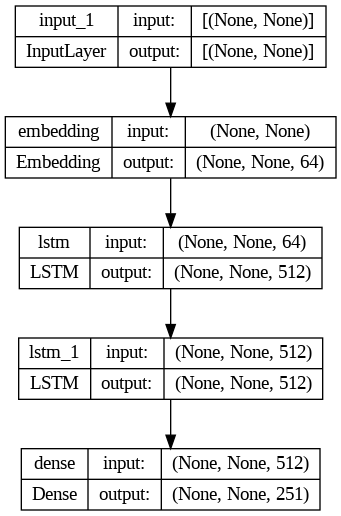

In [ ]:
tf.keras.utils.plot_model(model_jazz, show_shapes=True)

In [ ]:
history_jazz = model_jazz.fit(train_ds, validation_data=val_ds, epochs=100, callbacks=callbacks)

Epoch 1/100
120/120 [==============================] - 18s 74ms/step - loss: 4.2871 - val_loss: 4.2091
Epoch 2/100
120/120 [==============================] - 6s 40ms/step - loss: 3.1272 - val_loss: 2.5885
Epoch 3/100
120/120 [==============================] - 6s 39ms/step - loss: 2.5051 - val_loss: 2.4615
Epoch 4/100
120/120 [==============================] - 6s 38ms/step - loss: 2.3555 - val_loss: 2.3158
Epoch 5/100
120/120 [==============================] - 6s 39ms/step - loss: 2.2418 - val_loss: 2.2333
Epoch 6/100
120/120 [==============================] - 6s 40ms/step - loss: 2.1917 - val_loss: 2.1955
Epoch 7/100
120/120 [==============================] - 6s 41ms/step - loss: 2.1668 - val_loss: 2.1756
Epoch 8/100
120/120 [==============================] - 6s 39ms/step - loss: 2.1511 - val_loss: 2.1651
Epoch 9/100
120/120 [==============================] - 6s 39ms/step - loss: 2.1403 - val_loss: 2.1567
Epoch 10/100
120/120 [==============================] - 6s 39ms/step - loss: 2.13

val_loss [4.209079742431641, 2.58849835395813, 2.4614741802215576, 2.315800666809082, 2.2332634925842285, 2.195482015609741, 2.1756210327148438, 2.1651246547698975, 2.156681537628174, 2.1475563049316406, 2.142505407333374, 2.134434700012207, 2.1267757415771484, 2.1341075897216797, 2.126574754714966, 2.1197543144226074, 2.1165153980255127, 2.1153087615966797, 2.1112711429595947, 2.112281084060669, 2.113420009613037, 2.1038317680358887, 2.101625442504883, 2.100465774536133, 2.097935438156128, 2.096372604370117, 2.101715326309204, 2.0985519886016846, 2.093909502029419, 2.1014606952667236, 2.097799301147461, 2.0967025756835938, 2.098660707473755, 2.095435619354248, 2.093785524368286, 2.0917985439300537, 2.095165491104126, 2.091587781906128, 2.095658540725708, 2.0936391353607178, 2.0942423343658447, 2.0945191383361816, 2.0968732833862305, 2.095669984817505, 2.10113787651062, 2.099036693572998, 2.099003553390503, 2.1007847785949707, 2.101926565170288, 2.103752613067627, 2.1077511310577393, 2

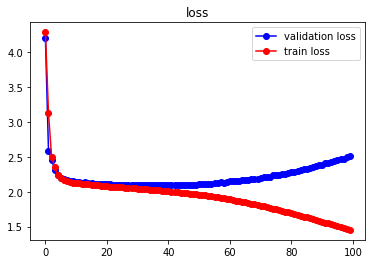

In [ ]:
plot_loss(history_jazz)

### Managing overfitting

The previous model overfits. Let us look at some techniques used to prevent overfitting.

#### EarlyStopping

The `EarlyStopping` callback interrupts training as soon as validation metrics
have stopped improving, while remembering the best known model state. We implemented EarlyStopping with a patience of 5, which means that the callback will stop the training when there is no improvement in the validation loss for five consecutive epochs.

In [ ]:
callbacks = [
    tf.keras.callbacks.ModelCheckpoint(
        filepath='./model/model_{epoch}',
        save_weights_only=True,
        save_best_only=True),
    tf.keras.callbacks.EarlyStopping(
        monitor='val_loss',
        patience=5,
        verbose=1,
        restore_best_weights=True),
]

#### Dropout and Recurrent Dropout

We implement dropout in our model with a `Dropout` layer between the last `LSTM` layer and the `Dense` layer.

We implement recurrent dropout by specifying `recurrent_dropout` in our recurrent layers.

In [ ]:
def build_model_with_dropout(vocab_size, embedding_dim, lstm_units, lstm_layers, learning_rate):
  inputs = tf.keras.layers.Input(shape=(None,), dtype=tf.int32)
  embedding_layer = tf.keras.layers.Embedding(
      input_dim=vocab_size,
      output_dim=embedding_dim
      )
  x = embedding_layer(inputs)

  for _ in range(lstm_layers):
    x = tf.keras.layers.LSTM(
        lstm_units, return_sequences=True, recurrent_dropout=0.5
        )(x)

  x = tf.keras.layers.Dropout(0.5)(x)
  outputs = tf.keras.layers.Dense(vocab_size)(x)

  model = tf.keras.Model(inputs=inputs, outputs=outputs)
  loss_fn = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)
  model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate), loss=loss_fn)
  return model

In [ ]:
model_jazz = build_model_with_dropout(VOCAB_SIZE, EMBEDDING_DIM, LSTM_UNITS, LSTM_LAYERS, LEARNING_RATE)
model_jazz.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, None)]            0         
                                                                 
 embedding_2 (Embedding)     (None, None, 64)          16064     
                                                                 
 lstm_2 (LSTM)               (None, None, 512)         1181696   
                                                                 
 lstm_3 (LSTM)               (None, None, 512)         2099200   
                                                                 
 dropout_1 (Dropout)         (None, None, 512)         0         
                                                                 
 dense_2 (Dense)             (None, None, 251)         128763    
                                                                 
Total params: 3,425,723
Trainable params: 3,425,723
Non-tra

In [ ]:
history_jazz = model_jazz.fit(train_ds, validation_data=val_ds, epochs=100, callbacks=callbacks)

Epoch 1/100
120/120 [==============================] - 40s 289ms/step - loss: 4.2852 - val_loss: 3.7580
Epoch 2/100
120/120 [==============================] - 32s 254ms/step - loss: 3.0854 - val_loss: 2.6997
Epoch 3/100
120/120 [==============================] - 32s 254ms/step - loss: 2.6327 - val_loss: 2.5214
Epoch 4/100
120/120 [==============================] - 32s 254ms/step - loss: 2.5162 - val_loss: 2.4773
Epoch 5/100
120/120 [==============================] - 31s 253ms/step - loss: 2.4818 - val_loss: 2.4499
Epoch 6/100
120/120 [==============================] - 31s 252ms/step - loss: 2.4380 - val_loss: 2.3764
Epoch 7/100
120/120 [==============================] - 31s 251ms/step - loss: 2.4007 - val_loss: 2.3391
Epoch 8/100
120/120 [==============================] - 31s 251ms/step - loss: 2.3202 - val_loss: 2.2225
Epoch 9/100
120/120 [==============================] - 31s 252ms/step - loss: 2.2383 - val_loss: 2.1759
Epoch 10/100
120/120 [==============================] - 31s 253m

val_loss [3.758042573928833, 2.699704647064209, 2.521425247192383, 2.4772822856903076, 2.4498844146728516, 2.3764145374298096, 2.3391032218933105, 2.2224605083465576, 2.1758644580841064, 2.154994010925293, 2.139376401901245, 2.1294145584106445, 2.1202807426452637, 2.1135189533233643, 2.1085362434387207, 2.1075968742370605, 2.1020050048828125, 2.0943071842193604, 2.0934557914733887, 2.0923068523406982, 2.089635133743286, 2.08878493309021, 2.0879743099212646, 2.085659980773926, 2.087045907974243, 2.0782971382141113, 2.0782649517059326, 2.0755934715270996, 2.0746994018554688, 2.0719051361083984, 2.073953628540039, 2.0704236030578613, 2.0761752128601074, 2.070347309112549, 2.073589563369751, 2.067370653152466, 2.069551944732666, 2.0722904205322266, 2.0682666301727295, 2.0673232078552246, 2.0649726390838623, 2.0679352283477783, 2.0663435459136963, 2.064678430557251, 2.064589262008667, 2.06634521484375, 2.0648350715637207, 2.065337657928467, 2.066038131713867, 2.065995454788208]
loss [4.2851

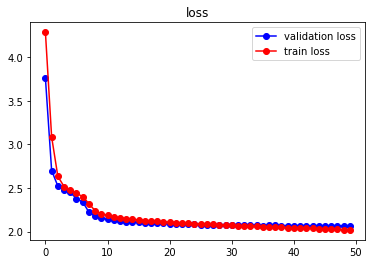

In [ ]:
plot_loss(history_jazz)

### Saving the model

In [ ]:
# Save the entire model as a SavedModel.
!mkdir -p saved_model
model_jazz.save('saved_model/jazz_model')

### Loading the model

In [10]:
model_jazz = tf.keras.models.load_model('saved_model/jazz_model')
model_jazz.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, None)]            0         
                                                                 
 embedding_3 (Embedding)     (None, None, 64)          16064     
                                                                 
 lstm_6 (LSTM)               (None, None, 512)         1181696   
                                                                 
 lstm_7 (LSTM)               (None, None, 512)         2099200   
                                                                 
 dropout_2 (Dropout)         (None, None, 512)         0         
                                                                 
 dense_3 (Dense)             (None, None, 251)         128763    
                                                                 
Total params: 3,425,723
Trainable params: 3,425,723
Non-tra

### Music generation

Let us use the trained model to generate some music based on a prompt taken by the test dataset.

In [ ]:
# Take a prompt sequence from the test dataset
prompt_jazz = None
for seq, labels in test_ds.take(1):
  prompt_jazz = seq.numpy()
prompt_jazz

array([247,  41, 110, 128, 193,  43, 109, 127, 192,  44, 107, 126, 190,
        45, 106, 133, 197,  46, 105, 131, 196,  48, 104, 134, 201,  45,
       104, 135, 199,  46, 106, 135, 206,  41, 107, 163, 229,  40, 113,
       124, 189,  41, 112, 127, 194,  34, 109, 180, 250, 248, 184,  41,
       107, 124, 189,  43, 108, 126, 191,  45, 108, 125, 189,  46],
      dtype=int32)

In [ ]:
def predict_next_token(tokens, keras_model, temperature = 1.0):
  """Generates a note IDs using a trained sequence model."""

  assert temperature > 0

  # Add batch dimension
  inputs = tf.expand_dims(tokens, 0)

  predictions = keras_model.predict(inputs, verbose = 0)
  # Take the last element from the sequence of predictions
  logits = predictions[:, -1, :]
  # Divide the distribution of probability by the temperature value
  logits /= temperature
  # Use stochastic sampling to predict the next token in the sequence
  next_token = tf.random.categorical(logits, num_samples=1)
  next_token = tf.squeeze(next_token, axis=-1)
  return int(next_token)

In [ ]:
def predict_n_tokens(seq_prompt, model, temperature, num_predictions):
  input_tokens = seq_prompt

  generated_tokens = seq_prompt.tolist()
  for _ in tqdm(range(num_predictions)):
    next_token = predict_next_token(input_tokens, model, temperature)
    generated_tokens.append(next_token)
    input_tokens = np.append(input_tokens, np.expand_dims(next_token, 0), axis=0)

  # return the prompt concatenated with the generated sequence
  return generated_tokens

In [ ]:
temperature = 1
num_predictions = 200

generated_tokens = predict_n_tokens(prompt_jazz, model_jazz, temperature, num_predictions)

  0%|          | 0/200 [00:00<?, ?it/s]

In [ ]:
generated_tokens[50:60]

[184, 41, 107, 124, 189, 43, 108, 126, 191, 45]

In [ ]:
midi = tokenizer_jazz.tokens_to_midi([generated_tokens])
midi.dump("generated_music/generated_jazz.mid")
display_audio("generated_music/generated_jazz.mid")

## Jazz Dataset with Byte Pair Encoding

We load the tokenizer trained with Byte Pair Encoding on the Jazz dataset.
The vocabulary is bigger, sequences are shorter.

In [15]:
tokenizer_jazz_bpe = TSD(params=Path(dataset_jazz/'train/tokens_bpe/config.txt'))
tokenizer_jazz_bpe.vocab

Vocabulary - 500 tokens of 6 types

In [16]:
train_dir = pathlib.Path(dataset_jazz/'train/tokens_bpe')
test_dir = pathlib.Path(dataset_jazz/'test/tokens_bpe')
val_dir = pathlib.Path(dataset_jazz/'val/tokens_bpe')

train_files = glob.glob(str(train_dir/'*.json'))
test_files = glob.glob(str(test_dir/'*.json'))
val_files = glob.glob(str(val_dir/'*.json'))

print('Training files: {}, Test files: {}, Validation files: {}'.format(len(train_files), len(test_files), len(val_files)))

Training files: 300, Test files: 86, Validation files: 42


### Preparing the training data

In [17]:
train_ds = create_sequences(train_files, SEQ_LENGTH)
test_ds = create_sequences(test_files, SEQ_LENGTH)
val_ds = create_sequences(val_files, SEQ_LENGTH)

len(train_ds)

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/86 [00:00<?, ?it/s]

  0%|          | 0/42 [00:00<?, ?it/s]

4406

In [ ]:
train_ds = prepare_dataset(train_ds)

print('Number of training batches: {}'.format(len(train_ds)))

Number of training batches: 68


In [ ]:
val_ds = prepare_dataset(val_ds)

print('Number of validation batches: {}'.format(len(val_ds)))

Number of validation batches: 12


### Building the model

In [ ]:
VOCAB_SIZE = len(tokenizer_jazz_bpe.vocab)

In [ ]:
model_jazz_bpe = build_model_with_dropout(VOCAB_SIZE, EMBEDDING_DIM, LSTM_UNITS, LSTM_LAYERS, LEARNING_RATE)
model_jazz_bpe.summary()

Model: "model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, None)]            0         
                                                                 
 embedding_4 (Embedding)     (None, None, 64)          32000     
                                                                 
 lstm_6 (LSTM)               (None, None, 512)         1181696   
                                                                 
 lstm_7 (LSTM)               (None, None, 512)         2099200   
                                                                 
 dropout_3 (Dropout)         (None, None, 512)         0         
                                                                 
 dense_4 (Dense)             (None, None, 500)         256500    
                                                                 
Total params: 3,569,396
Trainable params: 3,569,396
Non-tra

### Training the model

In [ ]:
history_jazz_bpe = model_jazz_bpe.fit(train_ds, validation_data=val_ds, epochs=100, callbacks=callbacks, use_multiprocessing=True)

Epoch 1/100
68/68 [==============================] - 27s 344ms/step - loss: 5.6644 - val_loss: 5.5459
Epoch 2/100
68/68 [==============================] - 18s 249ms/step - loss: 5.2464 - val_loss: 4.7013
Epoch 3/100
68/68 [==============================] - 18s 255ms/step - loss: 4.5249 - val_loss: 4.3221
Epoch 4/100
68/68 [==============================] - 17s 234ms/step - loss: 4.3229 - val_loss: 4.2163
Epoch 5/100
68/68 [==============================] - 17s 233ms/step - loss: 4.2054 - val_loss: 4.0842
Epoch 6/100
68/68 [==============================] - 17s 237ms/step - loss: 4.0793 - val_loss: 3.9764
Epoch 7/100
68/68 [==============================] - 17s 236ms/step - loss: 3.9952 - val_loss: 3.9051
Epoch 8/100
68/68 [==============================] - 17s 242ms/step - loss: 3.9411 - val_loss: 3.8725
Epoch 9/100
68/68 [==============================] - 17s 236ms/step - loss: 3.9069 - val_loss: 3.8365
Epoch 10/100
68/68 [==============================] - 17s 235ms/step - loss: 3.876

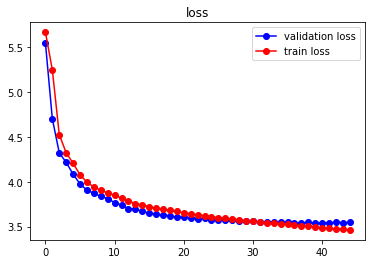

In [ ]:
plot_loss(history_jazz_bpe)

### Saving the model

In [ ]:
model_jazz_bpe.save('saved_model/jazz_model_bpe')

### Loading the model

In [18]:
model_jazz_bpe = tf.keras.models.load_model('saved_model/jazz_model_bpe')
model_jazz_bpe.summary()

Model: "model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, None)]            0         
                                                                 
 embedding_4 (Embedding)     (None, None, 64)          32000     
                                                                 
 lstm_6 (LSTM)               (None, None, 512)         1181696   
                                                                 
 lstm_7 (LSTM)               (None, None, 512)         2099200   
                                                                 
 dropout_3 (Dropout)         (None, None, 512)         0         
                                                                 
 dense_4 (Dense)             (None, None, 500)         256500    
                                                                 
Total params: 3,569,396
Trainable params: 3,569,396
Non-tra

### Music generation

In [ ]:
prompt_jazz_bpe = None
for seq, labels in test_ds.take(1):
  prompt_jazz_bpe = seq.numpy()

prompt_jazz_bpe

array([247, 466, 269,  43, 109, 260,  44, 107, 262,  45, 106, 133, 197,
        46, 105, 423,  48, 104, 134, 201,  45, 104, 135, 199,  46, 106,
       135, 206,  41, 107, 163, 229, 343, 258, 345, 368,  34, 109, 180,
       459,  41, 107, 258,  43, 108, 256,  45, 108, 263,  46, 109, 286,
        48, 107, 133, 199,  45, 107, 137, 202,  46, 106, 134, 201],
      dtype=int32)

In [ ]:
temperature = 1
num_predictions = 200

generated_tokens = predict_n_tokens(prompt_jazz_bpe, model_jazz_bpe, temperature, num_predictions)

midi = tokenizer_jazz_bpe.tokens_to_midi([generated_tokens])
midi.dump("generated_music/generated_jazz_bpe.mid")
display_audio("generated_music/generated_jazz_bpe.mid")

Output hidden; open in https://colab.research.google.com to view.

### Evaluating the model

In [21]:
test_ds_eval = prepare_dataset(test_ds)

losses = model_jazz_bpe.evaluate(test_ds_eval, return_dict=True)
losses

20/20 [==============================] - 5s 62ms/step - loss: 3.6258


{'loss': 3.6258416175842285}

## Hypertuning

We perform hyperparameters search on the dataset with Byte Pair Encoding.

Our model has the following hyperparameters:
* `embedding_dimension`, the output dimension of the Embedding layer
* `lstm_units`, the number of units of our recurrent layers
* `lstm_layers`, the number of recurrent layers in the model
* `learning_rate`, the learning rate of the Adam optimizer
* `dropout`, the dropout rate of the Dropout layer
* `recurrent_dropout`, the dropout rate of the recurrent layers

In [ ]:
def model_builder(hp):

  vocab_size = len(tokenizer_jazz_bpe.vocab)

  inputs = tf.keras.layers.Input(shape=(None,), dtype=tf.int32)

  hp_embedding_dim = hp.Int(
      'embedding_dimension', 
      min_value=64,
      max_value=128,
      step=64
  )
  
  hp_lstm_units = hp.Choice('lstm_units', values=[256, 512, 1024])
  
  hp_lstm_layers = hp.Int(
      'lstm_layers', 
      min_value=1,
      max_value=3,
      step=1
  )

  hp_learning_rate = hp.Choice('learning_rate', values=[1e-2, 1e-3])

  hp_dropout = hp.Choice('dropout', values=[0.2, 0.5, 0.8])

  hp_recurrent_dropout = hp.Choice('recurrent_dropout', values=[0.2, 0.5, 0.8])

  embedding_layer = tf.keras.layers.Embedding(
      input_dim=vocab_size,
      output_dim=hp_embedding_dim
      )
  
  x = embedding_layer(inputs)

  for _ in range(hp_lstm_layers):
    x = tf.keras.layers.LSTM(
      hp_lstm_units, return_sequences=True, recurrent_dropout=hp_recurrent_dropout
      )(x)

  x = tf.keras.layers.Dropout(hp_dropout)(x)

  outputs = tf.keras.layers.Dense(vocab_size)(x)

  model = tf.keras.Model(inputs=inputs, outputs=outputs)

  loss_fn = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)

  model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=hp_learning_rate), loss=loss_fn)
  
  return model

The Hyperband tuning algorithm uses adaptive resource allocation and early-stopping to quickly converge on a high-performing model. The algorithm trains a large number of models for a few epochs and carries forward only the top-performing half of models to the next round. Hyperband determines the number of models to train in a bracket by computing 1 + log<sub>`factor`</sub>(`max_epochs`) and rounding it up to the nearest integer.

In [ ]:
log_dir = "/logs/" + datetime.datetime.now().strftime("%m%d-%H%M")

tuner = kt.Hyperband(model_builder,
                     objective='val_loss',
                     overwrite=True,
                     max_epochs=100,
                     factor=3,
                     directory=log_dir,
                     project_name='LSTM')

In [ ]:
tuner.search(
    train_ds, 
    epochs=50, 
    validation_data=val_ds, 
    callbacks=[
        tf.keras.callbacks.EarlyStopping(
            monitor='val_loss',
            patience=5,
            verbose=0
        )
    ])

best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

Trial 254 Complete [00h 04m 35s]
val_loss: 3.53973126411438

Best val_loss So Far: 3.47442626953125
Total elapsed time: 08h 07m 16s


We save the best hyperparameters in a txt file.

In [ ]:
hyperparameters = {
    'embedding_dimension': best_hps.get('embedding_dimension'),
    'lstm_units': best_hps.get('lstm_units'),
    'lstm_layers': best_hps.get('lstm_layers'),
    'learning_rate': best_hps.get('learning_rate'),
    'dropout': best_hps.get('dropout'),
    'recurrent_dropout': best_hps.get('recurrent_dropout')
}

with open(f'rnn_hp_jazz_bpe.txt', 'w') as convert_file:
     convert_file.write(json.dumps(hyperparameters))

In [ ]:
!cp -R rnn_hp_jazz_bpe.txt '/content/drive/My Drive/__Baldi_Cecchetti/models/RNN/'

Let us train the model with the optimal hyperparameters for 100 epochs.

In [ ]:
# build the model with the optimal hyperparameters and train it 
decoder = tuner.hypermodel.build(best_hps)
history = decoder.fit(train_ds, epochs=100, validation_data=val_ds)

Epoch 1/100
68/68 [==============================] - 14s 167ms/step - loss: 4.9834 - val_loss: 4.1615
Epoch 2/100
68/68 [==============================] - 10s 131ms/step - loss: 4.1610 - val_loss: 3.7833
Epoch 3/100
68/68 [==============================] - 9s 129ms/step - loss: 3.9297 - val_loss: 3.6718
Epoch 4/100
68/68 [==============================] - 9s 129ms/step - loss: 3.8487 - val_loss: 3.6268
Epoch 5/100
68/68 [==============================] - 9s 124ms/step - loss: 3.8044 - val_loss: 3.6068
Epoch 6/100
68/68 [==============================] - 9s 127ms/step - loss: 3.7724 - val_loss: 3.5939
Epoch 7/100
68/68 [==============================] - 9s 124ms/step - loss: 3.7486 - val_loss: 3.5804
Epoch 8/100
68/68 [==============================] - 9s 127ms/step - loss: 3.7296 - val_loss: 3.5687
Epoch 9/100
68/68 [==============================] - 9s 124ms/step - loss: 3.7133 - val_loss: 3.5658
Epoch 10/100
68/68 [==============================] - 9s 122ms/step - loss: 3.6975 - val_

We find the best epoch and we use it to train the model.

In [ ]:
val_loss_per_epoch = history.history['val_loss']
best_epoch = val_loss_per_epoch.index(min(val_loss_per_epoch)) + 1
print('Best epoch: %d' % (best_epoch,))

Best epoch: 91


In [ ]:
hyperRNN = tuner.hypermodel.build(best_hps)

hyperRNN.fit(train_ds, epochs=best_epoch, validation_data=val_ds, callbacks=[
        tf.keras.callbacks.EarlyStopping(
            monitor="val_loss", mode="min", patience=10)
])

Epoch 1/91
68/68 [==============================] - 15s 176ms/step - loss: 4.9839 - val_loss: 4.1758
Epoch 2/91
68/68 [==============================] - 10s 142ms/step - loss: 4.1567 - val_loss: 3.7891
Epoch 3/91
68/68 [==============================] - 10s 132ms/step - loss: 3.9133 - val_loss: 3.6602
Epoch 4/91
68/68 [==============================] - 10s 133ms/step - loss: 3.8314 - val_loss: 3.6201
Epoch 5/91
68/68 [==============================] - 10s 142ms/step - loss: 3.7878 - val_loss: 3.5991
Epoch 6/91
68/68 [==============================] - 10s 132ms/step - loss: 3.7616 - val_loss: 3.5918
Epoch 7/91
68/68 [==============================] - 10s 142ms/step - loss: 3.7366 - val_loss: 3.5692
Epoch 8/91
68/68 [==============================] - 10s 132ms/step - loss: 3.7179 - val_loss: 3.5703
Epoch 9/91
68/68 [==============================] - 10s 131ms/step - loss: 3.7037 - val_loss: 3.5507
Epoch 10/91
68/68 [==============================] - 10s 132ms/step - loss: 3.6913 - val_lo

In [ ]:
hyperRNN.save('saved_model/jazz_model_tuned')

In [ ]:
!cp -R saved_model '/content/drive/My Drive/__Baldi_Cecchetti/models/RNN'

## Loading and testing the best model

Let us load the trained model with the best hyperparameters.

In [22]:
model_jazz_best = tf.keras.models.load_model('saved_model/jazz_model_tuned')
model_jazz_best.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, None)]            0         
                                                                 
 embedding_3 (Embedding)     (None, None, 64)          32000     
                                                                 
 lstm_3 (LSTM)               (None, None, 512)         1181696   
                                                                 
 dropout_3 (Dropout)         (None, None, 512)         0         
                                                                 
 dense_3 (Dense)             (None, None, 500)         256500    
                                                                 
Total params: 1,470,196
Trainable params: 1,470,196
Non-trainable params: 0
_________________________________________________________________


`get_config` allows us to see the optimal hyperparameters.

In [ ]:
model_jazz_best.get_config()

{'name': 'model_3',
 'layers': [{'class_name': 'InputLayer',
   'config': {'batch_input_shape': (None, None),
    'dtype': 'int32',
    'sparse': False,
    'ragged': False,
    'name': 'input_4'},
   'name': 'input_4',
   'inbound_nodes': []},
  {'class_name': 'Embedding',
   'config': {'name': 'embedding_3',
    'trainable': True,
    'dtype': 'float32',
    'batch_input_shape': (None, None),
    'input_dim': 500,
    'output_dim': 64,
    'embeddings_initializer': {'class_name': 'RandomUniform',
     'config': {'minval': -0.05, 'maxval': 0.05, 'seed': None}},
    'embeddings_regularizer': None,
    'activity_regularizer': None,
    'embeddings_constraint': None,
    'mask_zero': False,
    'input_length': None},
   'name': 'embedding_3',
   'inbound_nodes': [[['input_4', 0, 0, {}]]]},
  {'class_name': 'LSTM',
   'config': {'name': 'lstm_3',
    'trainable': True,
    'dtype': 'float32',
    'return_sequences': True,
    'return_state': False,
    'go_backwards': False,
    'stateful

In [ ]:
temperature = 1
num_predictions = 200

generated_tokens = predict_n_tokens(prompt_jazz_bpe, model_jazz_best, temperature, num_predictions)

midi = tokenizer_jazz_bpe.tokens_to_midi([generated_tokens])
midi.dump("generated_music/generated_jazz_best.mid")
display_audio("generated_music/generated_jazz_best.mid")

Output hidden; open in https://colab.research.google.com to view.

### Playing with the temperature value

Let us generate some samples by changing the temperature value. 

In [ ]:
num_predictions = 50

for temperature in [0.2, 0.5, 0.8, 1.0, 1.2, 1.5, 2.0]:
  generated_tokens = predict_n_tokens(prompt_jazz_bpe, model_jazz_best, temperature, num_predictions)
  midi = tokenizer_jazz_bpe.tokens_to_midi([generated_tokens])
  midi.dump("generated_music/generated_jazz_best" + str(temperature) + ".mid")

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The first 50 tokens of each midi file correspond to the prompt taken from the test dataset.

In [ ]:
  # 0.2
  display_audio("generated_music/generated_jazz_best0.2.mid")

In [ ]:
  # 0.5
  display_audio("generated_music/generated_jazz_best0.5.mid")

In [ ]:
  # 0.8
  display_audio("generated_music/generated_jazz_best0.8.mid")

In [ ]:
  # 1
  display_audio("generated_music/generated_jazz_best1.0.mid")

In [ ]:
  # 1.2
  display_audio("generated_music/generated_jazz_best1.2.mid")

In [ ]:
  # 1.5
  display_audio("generated_music/generated_jazz_best1.5.mid")

In [ ]:
  # 2
  display_audio("generated_music/generated_jazz_best2.0.mid")

### Evaluating the model

We evaluate the model with the best hyperparameters on the test dataset.

In [23]:
test_ds_evaluate = prepare_dataset(test_ds)
test_ds_evaluate

<PrefetchDataset element_spec=(TensorSpec(shape=(64, 64), dtype=tf.int32, name=None), TensorSpec(shape=(64, 64), dtype=tf.int32, name=None))>

In [24]:
# evaluate
losses = model_jazz_best.evaluate(test_ds_evaluate, return_dict=True)
losses

20/20 [==============================] - 1s 29ms/step - loss: 3.5717


{'loss': 3.571709394454956}

# Polyphonic music generation

### TSD Tokenizer

We load the tokenizer used to process the Piano dataset with Byte Pair Encoding.

In [29]:
from miditok import TSD

tokenizer_piano = TSD(params=Path(dataset_piano/'train/tokens_bpe/config.txt'))

tokenizer_piano.vocab

Vocabulary - 500 tokens of 8 types

In [30]:
import json

train_dir = pathlib.Path(dataset_piano/'train/tokens_bpe')
test_dir = pathlib.Path(dataset_piano/'test/tokens_bpe')
val_dir = pathlib.Path(dataset_piano/'val/tokens_bpe')

train_files = glob.glob(str(train_dir/'*.json'))
test_files = glob.glob(str(test_dir/'*.json'))
val_files = glob.glob(str(val_dir/'*.json'))

print(len(train_files), len(test_files), len(val_files))

542 156 77


## Preparing the training data

In [31]:
SEQ_LENGTH = 64

train_ds = create_sequences(train_files, SEQ_LENGTH)
test_ds = create_sequences(test_files, SEQ_LENGTH)
val_ds = create_sequences(val_files, SEQ_LENGTH)

  0%|          | 0/542 [00:00<?, ?it/s]

  0%|          | 0/156 [00:00<?, ?it/s]

  0%|          | 0/77 [00:00<?, ?it/s]

In [ ]:
train_ds = prepare_dataset(train_ds)

for input_example, target_example in train_ds.take(1):
    print("Input :", input_example)
    print("Target:", target_example)

Input : tf.Tensor(
[[ 35 255 291 ... 361  47 361]
 [271 155  31 ... 278  29 286]
 [145 155  37 ... 259  54 337]
 ...
 [320  55 265 ...  24 470  48]
 [ 43 267  55 ...  33 268  36]
 [213 154  66 ... 101 279  24]], shape=(64, 64), dtype=int32)
Target: tf.Tensor(
[[255 291 244 ...  47 361  49]
 [155  31 276 ...  29 286  34]
 [155  37 344 ...  54 337  35]
 ...
 [ 55 265  55 ... 470  48 290]
 [267  55 107 ... 268  36 276]
 [154  66 467 ... 279  24 352]], shape=(64, 64), dtype=int32)


In [ ]:
val_ds = prepare_dataset(val_ds)

len(val_ds)

72

## Building the model

We try with a more complex model due to the fact that we have more data and the song are longer.

In [ ]:
EMBEDDING_DIM = 128

LSTM_UNITS = 512

LSTM_LAYERS = 3

LEARNING_RATE = 1e-3

VOCAB_SIZE = len(tokenizer_piano.vocab)

In [ ]:
model_piano = build_model_with_dropout(VOCAB_SIZE, EMBEDDING_DIM, LSTM_UNITS, LSTM_LAYERS, LEARNING_RATE)
model_piano.summary()

Model: "model_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_9 (InputLayer)        [(None, None)]            0         
                                                                 
 embedding_8 (Embedding)     (None, None, 128)         64000     
                                                                 
 lstm_16 (LSTM)              (None, None, 512)         1312768   
                                                                 
 lstm_17 (LSTM)              (None, None, 512)         2099200   
                                                                 
 lstm_18 (LSTM)              (None, None, 512)         2099200   
                                                                 
 dropout_7 (Dropout)         (None, None, 512)         0         
                                                                 
 dense_8 (Dense)             (None, None, 500)         2565

## Training the model

In [ ]:
callbacks = [
    tf.keras.callbacks.ModelCheckpoint(
        filepath='./model/model_{epoch}',
        save_weights_only=True,
        save_best_only=True),
    tf.keras.callbacks.EarlyStopping(
        monitor='val_loss',
        patience=5,
        verbose=1,
        restore_best_weights=True),
]

In [ ]:
history = model_piano.fit(train_ds, validation_data=val_ds, epochs=50, callbacks=callbacks)

Epoch 1/50
492/492 [==============================] - 175s 342ms/step - loss: 4.8884 - val_loss: 4.1929
Epoch 2/50
492/492 [==============================] - 168s 336ms/step - loss: 4.0529 - val_loss: 3.8369
Epoch 3/50
492/492 [==============================] - 169s 338ms/step - loss: 3.8250 - val_loss: 3.6728
Epoch 4/50
492/492 [==============================] - 171s 344ms/step - loss: 3.6882 - val_loss: 3.5442
Epoch 5/50
492/492 [==============================] - 174s 349ms/step - loss: 3.5498 - val_loss: 3.4083
Epoch 6/50
492/492 [==============================] - 171s 344ms/step - loss: 3.4456 - val_loss: 3.3278
Epoch 7/50
492/492 [==============================] - 168s 338ms/step - loss: 3.3656 - val_loss: 3.2335
Epoch 8/50
492/492 [==============================] - 167s 335ms/step - loss: 3.2879 - val_loss: 3.1737
Epoch 9/50
492/492 [==============================] - 167s 335ms/step - loss: 3.2346 - val_loss: 3.1356
Epoch 10/50
492/492 [==============================] - 169s 339m

## Saving the model

In [ ]:
model_piano.save('saved_model/piano_model')

## Loading the model

In [28]:
model_piano = tf.keras.models.load_model('saved_model/piano_model')
model_piano.summary()

Model: "model_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_9 (InputLayer)        [(None, None)]            0         
                                                                 
 embedding_8 (Embedding)     (None, None, 128)         64000     
                                                                 
 lstm_16 (LSTM)              (None, None, 512)         1312768   
                                                                 
 lstm_17 (LSTM)              (None, None, 512)         2099200   
                                                                 
 lstm_18 (LSTM)              (None, None, 512)         2099200   
                                                                 
 dropout_7 (Dropout)         (None, None, 512)         0         
                                                                 
 dense_8 (Dense)             (None, None, 500)         2565

## Music generation

In [ ]:
# Take a prompt sequence from the test dataset
prompt_piano = None
for seq, labels in test_ds.shuffle(100).take(1):
  prompt_piano = seq.numpy()

In [ ]:
temperature = 1
num_predictions = 300

generated_tokens = predict_n_tokens(prompt_piano, model_piano, temperature, num_predictions)

  0%|          | 0/300 [00:00<?, ?it/s]

In [ ]:
midi = tokenizer_piano.tokens_to_midi([generated_tokens])
midi.dump("generated_music/generated_piano.mid")
display_audio("generated_music/generated_piano.mid")

### Evaluating the model

We evaluate the model with the best hyperparameters on the test dataset.

In [33]:
test_ds_evaluate = prepare_dataset(test_ds)
test_ds_evaluate

<PrefetchDataset element_spec=(TensorSpec(shape=(64, 64), dtype=tf.int32, name=None), TensorSpec(shape=(64, 64), dtype=tf.int32, name=None))>

In [34]:
# evaluate
losses = model_piano.evaluate(test_ds_evaluate, return_dict=True)
losses

140/140 [==============================] - 14s 89ms/step - loss: 2.7906


{'loss': 2.7905843257904053}

The next step would be performing the hyperparameter search for this dataset. Unfortunately we were not able to due to the limited resources offered by Google Colab.

In [ ]:
#!cp -r saved_model/piano_model /content/drive/MyDrive/__Baldi_Cecchetti/models/RNN/saved_model

In [ ]:
#!cp -r generated_music /content/drive/MyDrive/__Baldi_Cecchetti/models/RNN